In [1]:
from transformers import AutoModel
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Figure Styling

In [2]:
# color map (dark around zero, bright on both extremes)
cmap='twilight'

# figure size and resolution
plt.rcParams["figure.figsize"] = (10,8)
plt.rcParams["figure.dpi"] = 300

# Load Models

In [ ]:
# GPT-2
gpt2 = AutoModel.from_pretrained('gpt2-xl')
wpe_gpt = gpt2.wpe.weight.detach().numpy()
# BERT
bert = AutoModel.from_pretrained('bert-large-uncased')
wpe_bert = bert.embeddings.position_embeddings.weight.detach().numpy()

# Shapes

In [4]:
wpe_gpt.shape

(1024, 1600)

In [5]:
wpe_bert.shape

(512, 1024)

# Statistics

In [6]:
pd.DataFrame(wpe_gpt.flatten()).describe()

,0
count,1.638400e+06
mean,-1.019791e-04
std,1.516441e-02
min,-2.057268e+00
25%,-2.466520e-03
50%,-1.503477e-05
75%,2.432974e-03
max,1.274699e+00


In [7]:
pd.DataFrame(wpe_bert.flatten()).describe()

,0
count,524288.000000
mean,0.000019
std,0.016590
min,-0.493828
25%,-0.010341
50%,0.000013
75%,0.010397
max,1.065835


# Histograms

## GPT-2

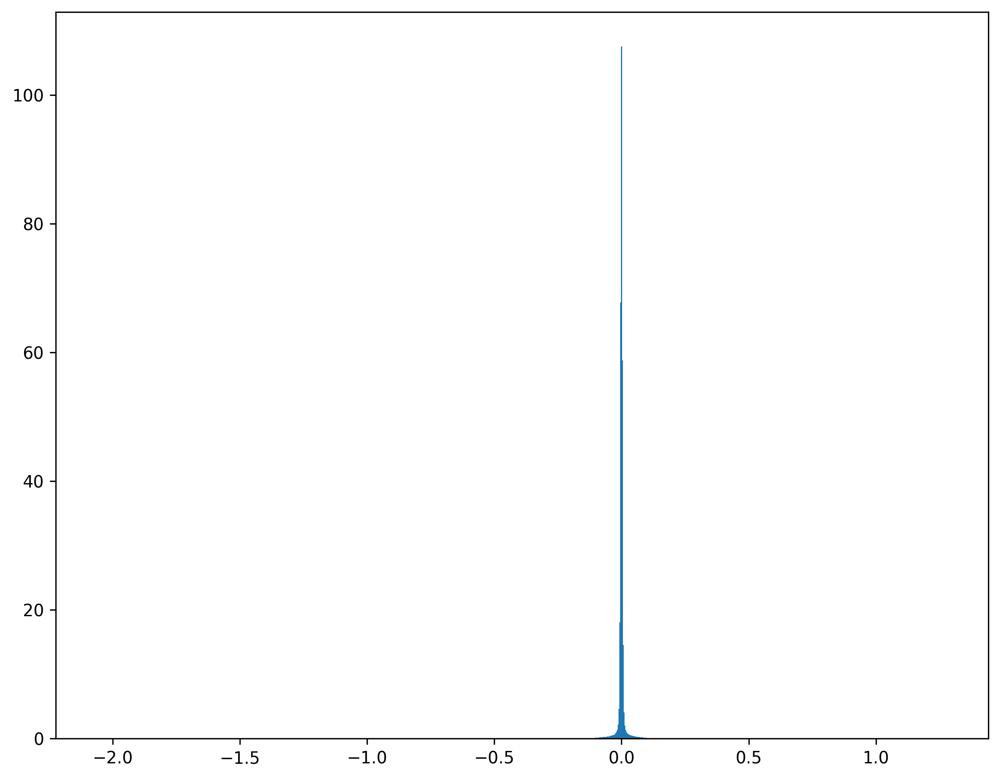

In [8]:
plt.hist(wpe_gpt.flatten(), bins=1000, density=True)
plt.show()

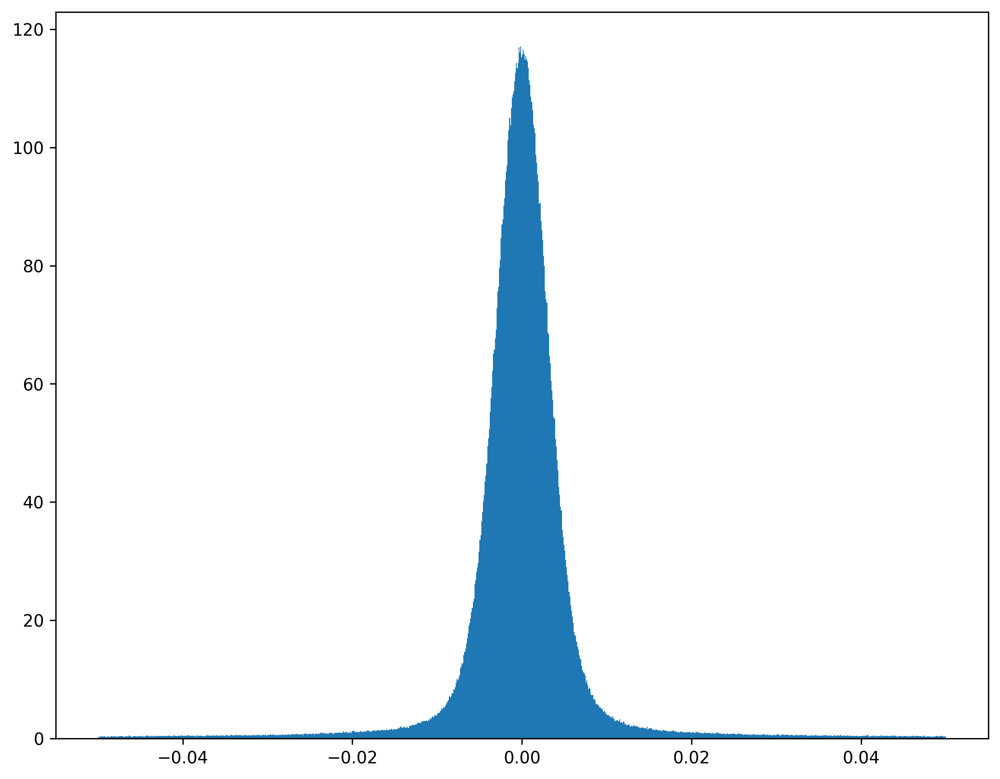

In [9]:
plt.hist(wpe_gpt.flatten(), bins=1000, range=[-0.05, 0.05], density=True)
plt.show()

## BERT

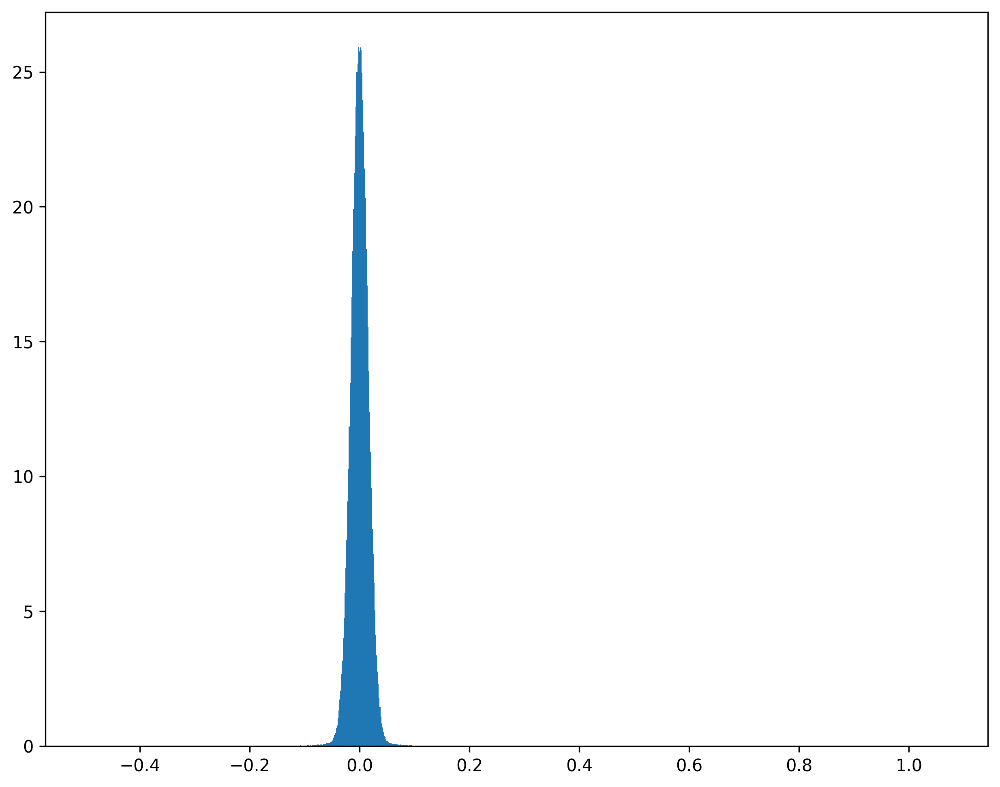

In [10]:
plt.hist(wpe_bert.flatten(), bins=1000, density=True)
plt.show()

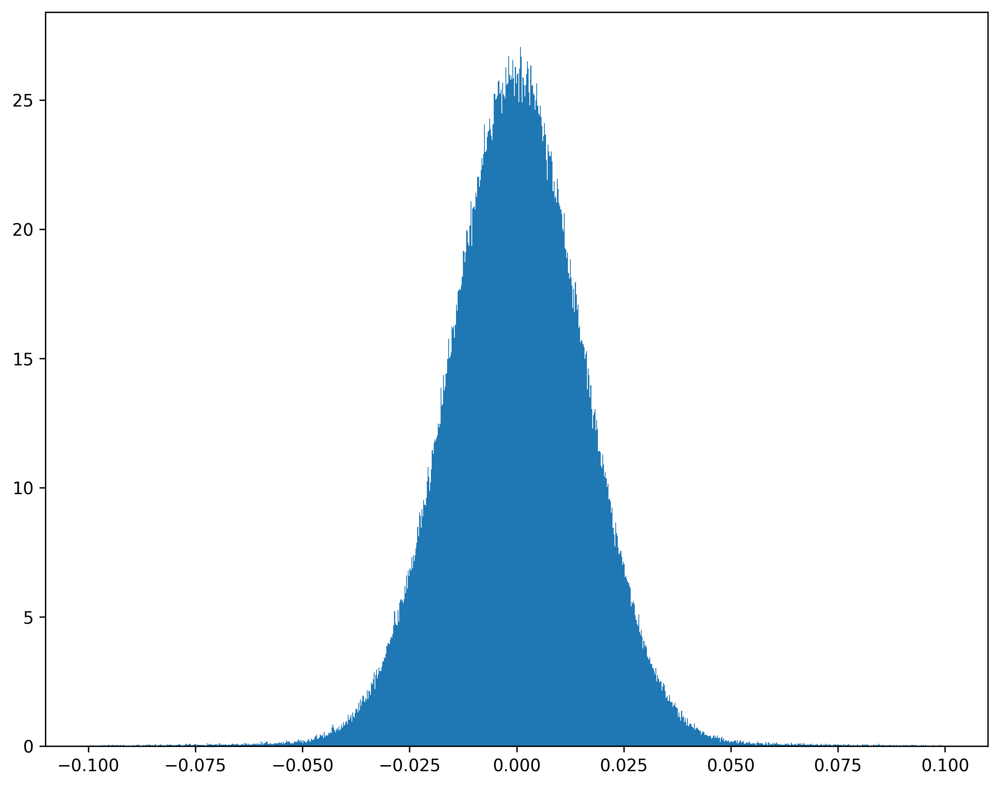

In [11]:
plt.hist(wpe_bert.flatten(), bins=1000, range=[-0.1, 0.1], density=True)
plt.show()

# Visualizations of Positional Encodings

## GPT-2

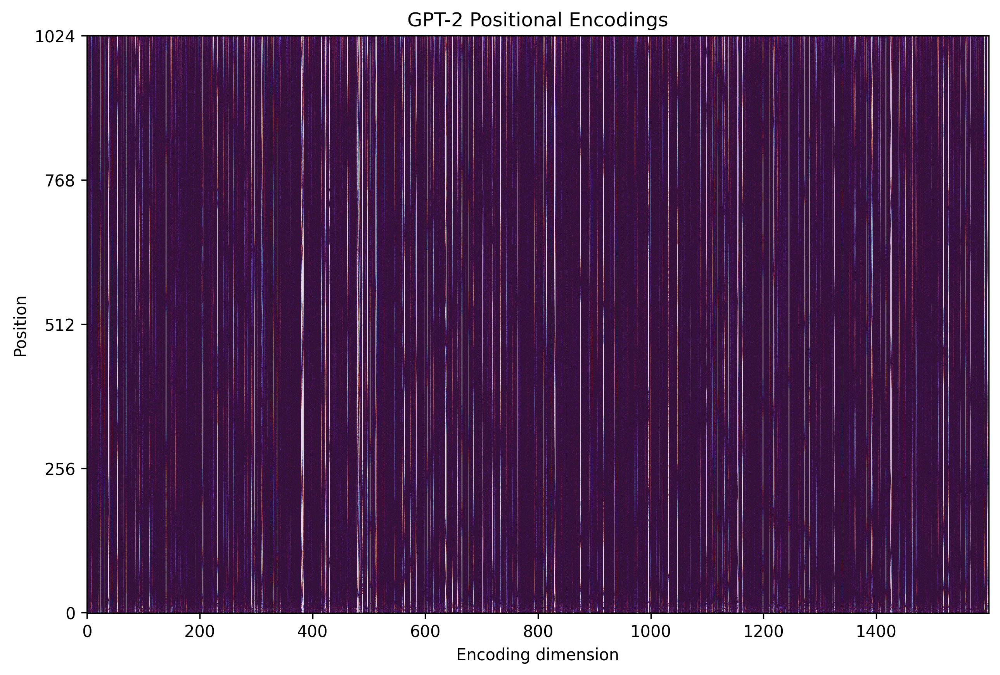

In [12]:
plt.imshow(wpe_gpt, vmin=-0.05, vmax=0.05, interpolation="none", origin='lower', cmap=cmap)
plt.yticks([0,256,512,768,1024])
plt.xlabel('Encoding dimension')
plt.ylabel('Position')
plt.title('GPT-2 Positional Encodings')
plt.show()

## BERT

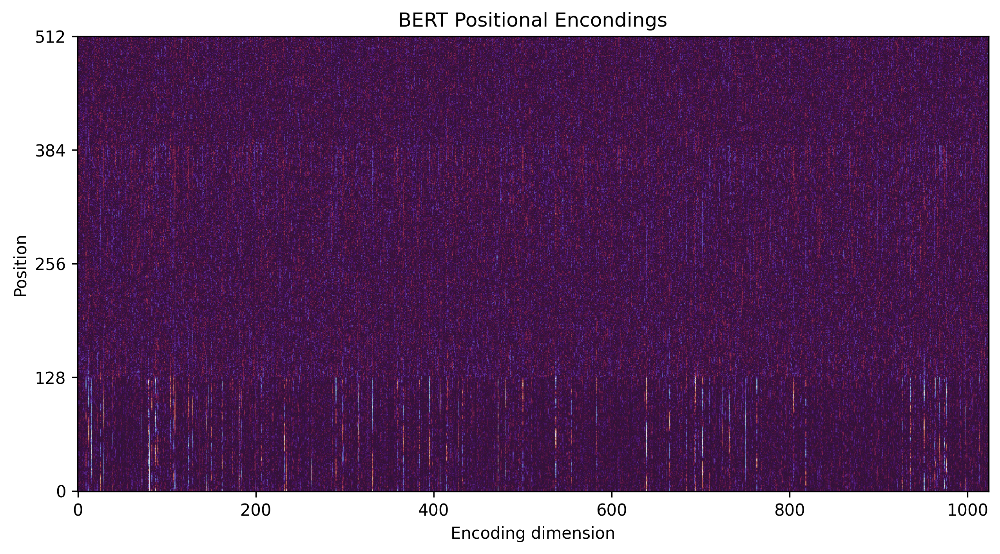

In [13]:
plt.imshow(wpe_bert, vmin=-.12, vmax=.12, interpolation="none", origin='lower', cmap=cmap)
plt.yticks([0,128,256,384,512])
plt.xlabel('Encoding dimension')
plt.ylabel('Position')
plt.title('BERT Positional Encondings')
plt.show()

## Sorted by 2-Norm

### GPT-2

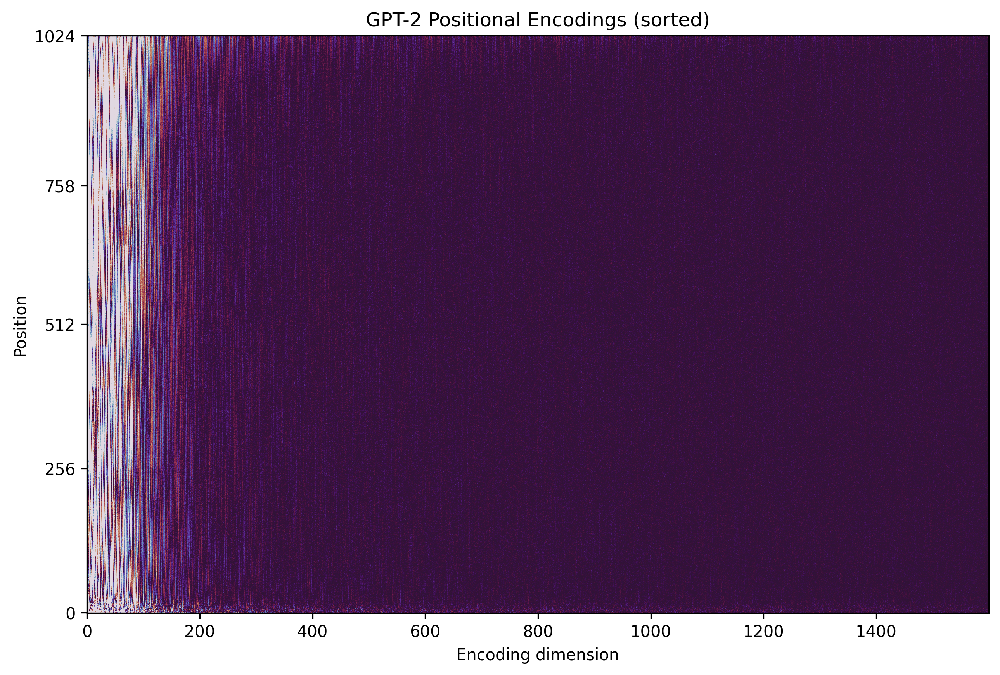

In [14]:
# sort cols by 2-norm (descending)
wpe_gpt_sort_idxs = np.argsort(-np.linalg.norm(wpe_gpt, axis=0))
wpe_gpt_sort = wpe_gpt[:,wpe_gpt_sort_idxs]
# plot
plt.imshow(wpe_gpt_sort, vmin=-0.05, vmax=0.05, interpolation="none", origin='lower', cmap=cmap)
plt.yticks([0,256,512,758,1024])
plt.xlabel('Encoding dimension')
plt.ylabel('Position')
plt.title('GPT-2 Positional Encodings (sorted)')
plt.show()

### BERT

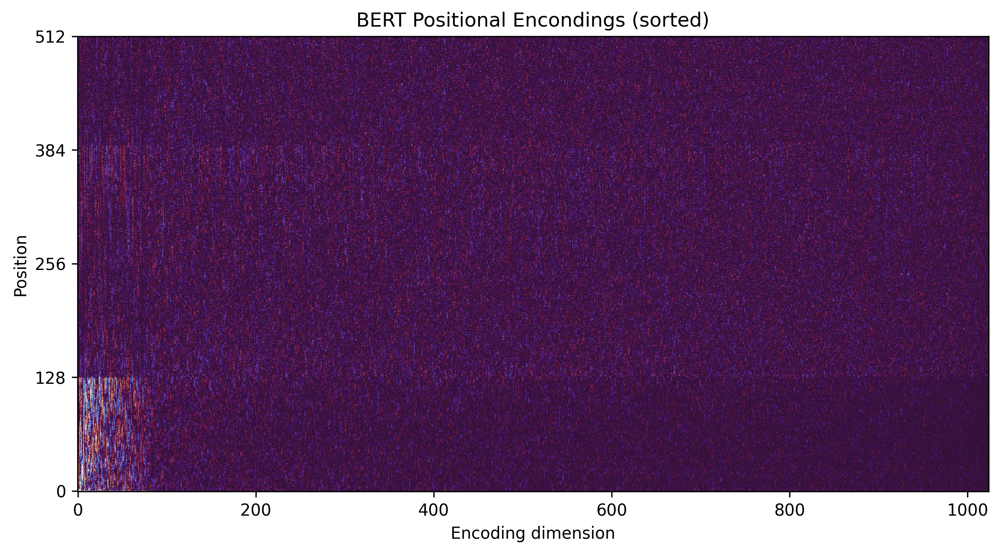

In [15]:
# sort cols by maximum abolute value (descending)
wpe_bert_sort_idxs = np.argsort(-np.linalg.norm(wpe_bert, axis=0))
wpe_bert_sort = wpe_bert[:,wpe_bert_sort_idxs]
# plot
plt.imshow(wpe_bert_sort, vmin=-0.12, vmax=0.12, interpolation="none", origin='lower', cmap=cmap)
plt.yticks([0,128,256,384,512])
plt.xlabel('Encoding dimension')
plt.ylabel('Position')
plt.title('BERT Positional Encondings (sorted)')
plt.show()